In [2]:
import json
from collections import defaultdict

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.cluster import KMeans
from matplotlib.patches import Rectangle

import PIL
from PIL import Image, ImageDraw

In [3]:
with open("../dataset/train.json", "r") as f:
    json_data = json.load(f)

print(json.dumps(json_data, indent="\t"))

{
	"info": {
		"year": 2021,
		"version": "1.0",
		"description": "Recycle Trash",
		"contributor": "Upstage",
		"url": null,
		"date_created": "2021-02-02 01:10:00"
	},
	"licenses": [
		{
			"id": 0,
			"name": "CC BY 4.0",
			"url": "https://creativecommons.org/licenses/by/4.0/deed.ast"
		}
	],
	"images": [
		{
			"width": 1024,
			"height": 1024,
			"file_name": "train/0000.jpg",
			"license": 0,
			"flickr_url": null,
			"coco_url": null,
			"date_captured": "2020-12-26 14:44:23",
			"id": 0
		},
		{
			"width": 1024,
			"height": 1024,
			"file_name": "train/0001.jpg",
			"license": 0,
			"flickr_url": null,
			"coco_url": null,
			"date_captured": "2021-01-10 16:30:39",
			"id": 1
		},
		{
			"width": 1024,
			"height": 1024,
			"file_name": "train/0002.jpg",
			"license": 0,
			"flickr_url": null,
			"coco_url": null,
			"date_captured": "2020-12-27 17:55:52",
			"id": 2
		},
		{
			"width": 1024,
			"height": 1024,
			"file_name": "train/0003.jpg",
			"license": 0,
			"flickr_u

In [3]:
print(json_data['categories']) 
x_ticks = [i['name'] for i in json_data['categories']]
print(x_ticks)

[{'id': 0, 'name': 'General trash', 'supercategory': 'General trash'}, {'id': 1, 'name': 'Paper', 'supercategory': 'Paper'}, {'id': 2, 'name': 'Paper pack', 'supercategory': 'Paper pack'}, {'id': 3, 'name': 'Metal', 'supercategory': 'Metal'}, {'id': 4, 'name': 'Glass', 'supercategory': 'Glass'}, {'id': 5, 'name': 'Plastic', 'supercategory': 'Plastic'}, {'id': 6, 'name': 'Styrofoam', 'supercategory': 'Styrofoam'}, {'id': 7, 'name': 'Plastic bag', 'supercategory': 'Plastic bag'}, {'id': 8, 'name': 'Battery', 'supercategory': 'Battery'}, {'id': 9, 'name': 'Clothing', 'supercategory': 'Clothing'}]
['General trash', 'Paper', 'Paper pack', 'Metal', 'Glass', 'Plastic', 'Styrofoam', 'Plastic bag', 'Battery', 'Clothing']


In [4]:
print(len(json_data['images']))
print(json_data['images'][0])
print(json_data['images'][-1])

4883
{'width': 1024, 'height': 1024, 'file_name': 'train/0000.jpg', 'license': 0, 'flickr_url': None, 'coco_url': None, 'date_captured': '2020-12-26 14:44:23', 'id': 0}
{'width': 1024, 'height': 1024, 'file_name': 'train/4882.jpg', 'license': 0, 'flickr_url': None, 'coco_url': None, 'date_captured': '2020-12-23 16:20:30', 'id': 4882}


In [5]:
print(len(json_data['annotations']))
print(json_data['annotations'][0])
print(json_data['annotations'][2233])
print(json_data['annotations'][-1])

23144
{'image_id': 0, 'category_id': 0, 'area': 257301.66, 'bbox': [197.6, 193.7, 547.8, 469.7], 'iscrowd': 0, 'id': 0}
{'image_id': 453, 'category_id': 7, 'area': 81098.08, 'bbox': [385.3, 816.4, 391.4, 207.2], 'iscrowd': 0, 'id': 2233}
{'image_id': 4882, 'category_id': 1, 'area': 149633.22, 'bbox': [145.4, 295.4, 420.2, 356.1], 'iscrowd': 0, 'id': 23143}


In [6]:
df = pd.DataFrame({'image_id':[], "category_id":[], 'bbox_x':[], 'bbox_y':[], 
                   'bbox_w':[], 'bbox_h':[], 'ratio':[], 'area':[]})

for i,info in enumerate(json_data['annotations']): 
    df.loc[i] = [ 
        int(info['image_id']),
        int(info['category_id']),
        info['bbox'][0],    # xmin 좌표
        info['bbox'][1],    # ymin 좌표
        info['bbox'][2],    # width 길이
        info['bbox'][3],    # height 길이
        round(info['bbox'][2] / info['bbox'][3], 1),    # 정사각형에 가까운지, 직사각형에 가까운지에 대한 ratio
        info['area'], 
        ] 

print(df.head())

   image_id  category_id  bbox_x  bbox_y  bbox_w  bbox_h  ratio       area
0       0.0          0.0   197.6   193.7   547.8   469.7    1.2  257301.66
1       1.0          3.0     0.0   407.4    57.6   180.6    0.3   10402.56
2       1.0          7.0     0.0   455.6   144.6   181.6    0.8   26259.36
3       1.0          4.0   722.3   313.4   274.3   251.9    1.1   69096.17
4       1.0          5.0   353.2   671.0   233.7   103.4    2.3   24164.58


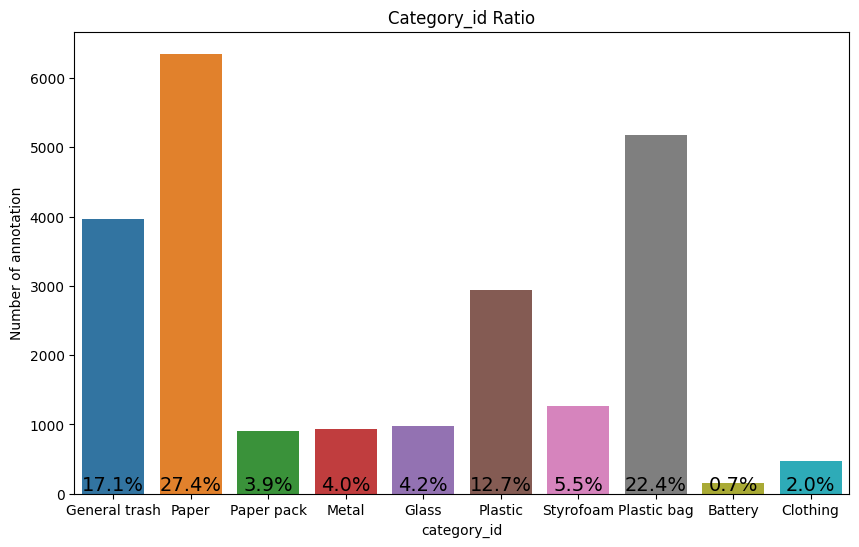

In [7]:
plt.figure(figsize=(10,6))                              # ! Class Imbalance 확인
ax = sns.countplot(x ='category_id', data=df)
plt.title("Category_id Ratio")
plt.ylabel("Number of annotation")
plt.xticks(range(len(x_ticks)),x_ticks)
count = df['category_id'].value_counts()
count = dict(sorted(count.items()))

counts = [f'{elem/sum(count.values()) * 100:.1f}%' for elem in count.values()]
for i,v in enumerate(counts):
    ax.text(i, 50, v, horizontalalignment='center', size= 14, color="black")

plt.show() 

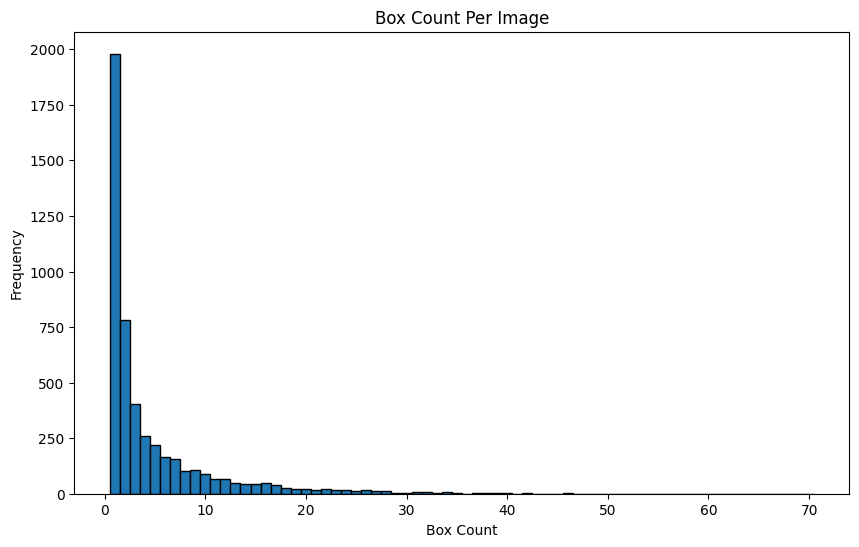

In [8]:
# 각 이미지의 박스 개수 계산 
box_counts = df.groupby('image_id')['category_id'].count()          # ! 각 image당 bbox 갯수는 1~3개가 가장 많음

# 히스토그램 그리기
plt.figure(figsize=(10, 6)) 
plt.hist(box_counts, bins=70, edgecolor='black',align='left') 
plt.xlabel('Box Count') 
plt.ylabel('Frequency') 
plt.title('Box Count Per Image') 
plt.show() 

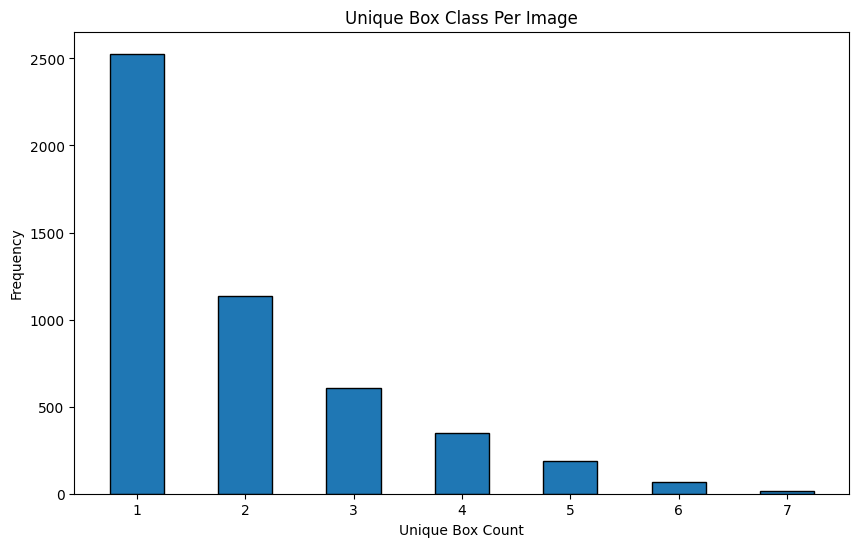

In [9]:
# 각 이미지의 클래스 계산 
unique_box = df.groupby('image_id')['category_id'].nunique()        # ! 각 image당 class 갯수는 1개가 가장 많음

plt.figure(figsize=(10, 6)) 
plt.hist(unique_box, bins=range(1, unique_box.max()+2), 
edgecolor='black',rwidth=0.5, align='left') 
plt.xlabel('Unique Box Count') 
plt.ylabel('Frequency') 
plt.title('Unique Box Class Per Image') 
plt.show()

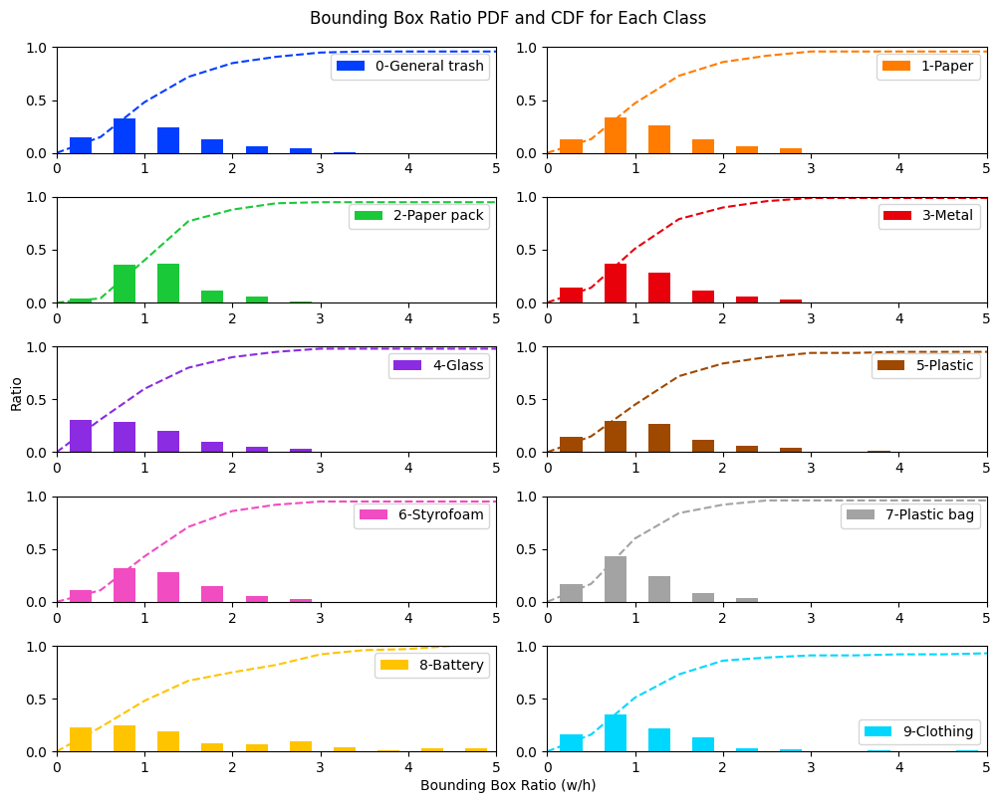

In [10]:
ratio_count = df.groupby(['category_id', 'ratio']).size().reset_index(name='count') 

# count_ratio 계산 
class_counts = df['category_id'].value_counts() 
ratio_count['count_ratio'] = ratio_count.apply(lambda row: round(row['count'] / 
                                                class_counts[int(row['category_id'])], 2), axis=1) 

default_palette = sns.color_palette('bright')[:10] 
fig, axs = plt.subplots(5, 2, figsize=(10, 8)) 

for category_id in range(10): 
    category_data = ratio_count[ratio_count['category_id'] == category_id] 

    # PDF 그래프 
    pdf_data = pd.DataFrame({'ratio': np.arange(0, category_data['ratio'].max() + 0.5, 0.5)}) 
    pdf_data['pdf'] = pdf_data['ratio'].apply(lambda x: category_data[category_data['ratio'] <= x]['count_ratio'].sum()) 
    pdf_data['pdf'] = pdf_data['pdf'] - pdf_data['pdf'].shift(1).fillna(0)  # 누적
    axs[category_id // 2, category_id % 2].bar(pdf_data['ratio']-0.35,
        pdf_data['pdf'], width=0.25, align='edge', color=default_palette[category_id],
        label=f'{category_id}-{x_ticks[category_id]}') 

    # CDF 그래프 
    cdf_data = pd.DataFrame({'ratio': pdf_data['ratio'], 'cdf': np.cumsum(pdf_data['pdf'])}) 
    axs[category_id // 2, category_id % 2].plot(cdf_data['ratio'], 
        cdf_data['cdf'], linestyle='--', color=default_palette[category_id]) 

    axs[category_id // 2, category_id % 2].set_xlim(0, 5) 
    axs[category_id // 2, category_id % 2].set_ylim(0, 1) 
    axs[category_id // 2, category_id % 2].set_xlabel("") 
    axs[category_id // 2, category_id % 2].set_ylabel("") 
    axs[category_id // 2, category_id % 2].legend() 

plt.suptitle('Bounding Box Ratio PDF and CDF for Each Class') 
fig.text(0.5, 0.00, 'Bounding Box Ratio (w/h)', ha='center') 
fig.text(0.0, 0.5, 'Ratio', va='center', rotation='vertical') 
plt.tight_layout() 
plt.show()              # ! 4-Glass & 8-Battery 만 직사각형 모양의 BBox가 비교적 많음

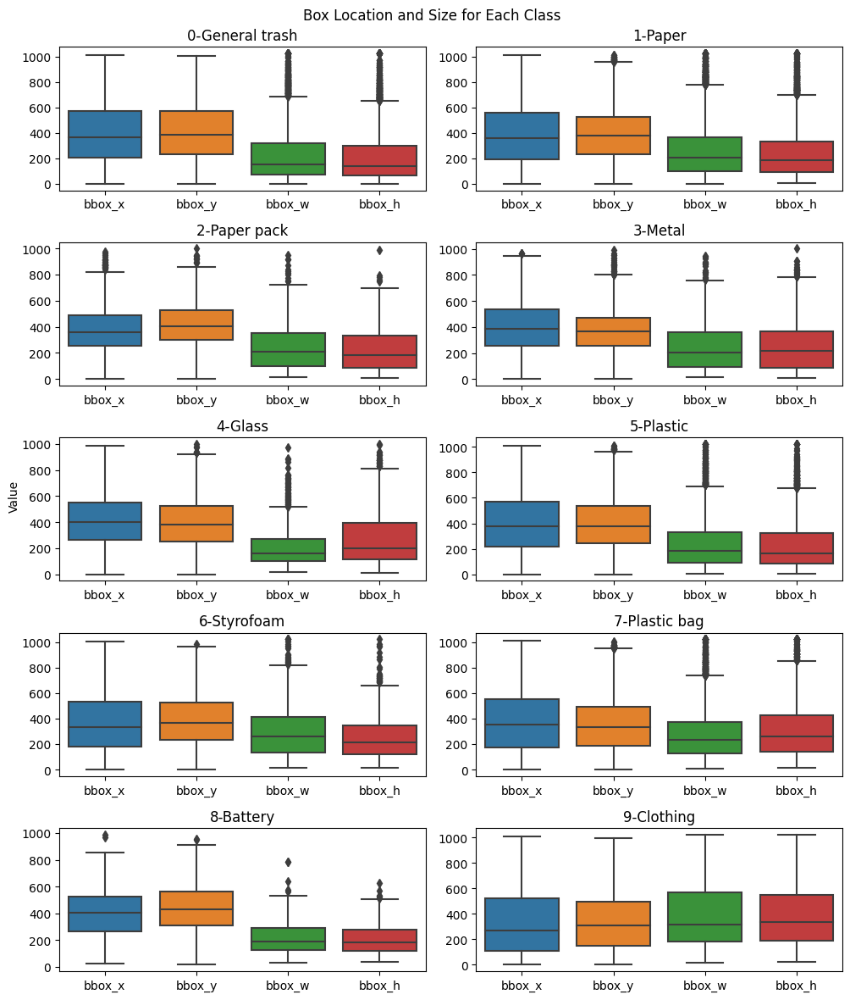

In [11]:
bbox_data = df[['bbox_x', 'bbox_y', 'bbox_w', 'bbox_h']]            # ! 9-Cloting은 Outlier가 없음

# Figure 생성 
fig, axs = plt.subplots(5, 2, figsize=(10, 12)) 

# 클래스별로 반복하여 subplot에 박스 위치 및 크기 정보 시각화
for i, (category, data) in enumerate(bbox_data.groupby(df['category_id'])): 
    ax = axs[i // 2, i % 2] 
    sns.boxplot(data=data, ax=ax) 
    ax.set_title(f'{i}-{x_ticks[i]}') 
    ax.set_xlabel("")
    ax.set_ylabel("")

plt.suptitle('Box Location and Size for Each Class') 
fig.text(0.0, 0.5, 'Value', va='center', rotation='vertical') 
plt.tight_layout()
plt.show()

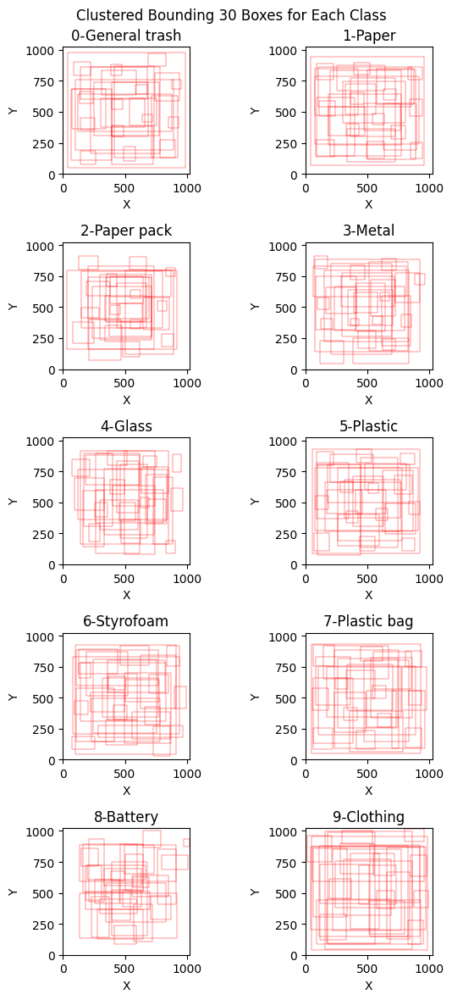

In [12]:
bbox_data = df[['bbox_x', 'bbox_y', 'bbox_w', 'bbox_h']]
class_counts = df['category_id'].value_counts()

n_clusters = (class_counts // 10).clip(1)

# 클래스별로 반복하여 subplot에 박스 그리기
fig, axs = plt.subplots(5, 2, figsize=(6, 12))
for i, (category, data) in enumerate(bbox_data.groupby(df['category_id'])):
    ax = axs[i // 2, i % 2]

    # 클러스터 개수 설정 
    num_clusters = 30

    # 클러스터링 모델 생성
    clustering_model = KMeans(n_clusters=num_clusters)

    # 클러스터링 수행
    clustering_labels = clustering_model.fit_predict(data)
    unique_labels = np.unique(clustering_labels)

    # 대표적인 박스 선택 및 그리기
    for label in unique_labels:
        cluster_data = data[clustering_labels == label]
        representative_box = cluster_data.mean()

        rect = Rectangle((representative_box['bbox_x'],
                        representative_box['bbox_y']), representative_box['bbox_w'],
                        representative_box['bbox_h'], linewidth=0.3, edgecolor='r', facecolor='none')
        ax.add_patch(rect)


    ax.set_xlim(0, 1024)  # X축 범위 설정 
    ax.set_ylim(0, 1024)  # Y축 범위 설정 
    ax.set_xlabel('X') 
    ax.set_ylabel('Y') 
    ax.set_title(f'{i}-{x_ticks[i]}') 
    ax.set_aspect('equal')  # X축과 Y축의 스케일을 동일하게 설정 

plt.suptitle(f'Clustered Bounding {num_clusters} Boxes for Each Class') 
plt.tight_layout()
plt.show()

In [13]:
outlier_cnt = 0                 # ! Image size를 벗어나는 Bbox가 있는지 확인 -> 없음
outlier_indices = []

for annot_info in json_data['annotations']:
    image_id = annot_info["image_id"]
    xmin, ymin, width, height = annot_info["bbox"]
    xmax, ymax = xmin + width, ymin + height
    
    if (xmin < 0 or xmin > 1024) or (ymin < 0 or ymin > 1024) or (xmax < 0 or xmax > 1024) or (ymax < 0 or ymax > 1024):
        outlier_cnt += 1
        outlier_indices.append(image_id)

print(f"Outlier Count = {outlier_cnt}")
print(f"Outlier Box Indices = {outlier_indices}")

Outlier Count = 0
Outlier Box Indices = []


File Name = ../dataset/train/0946.jpg
(0.0, 783.2, 103.6, 240.4)
(267.4, 817.8, 73.9, 106.0)
(302.0, 798.8, 40.6, 41.3)
(267.2, 589.9, 88.9, 249.2)
(319.5, 667.4, 45.0, 93.1)
(184.4, 353.2, 319.2, 332.2)
(134.9, 538.4, 185.1, 386.4)
(86.9, 872.6, 195.0, 151.0)
(94.0, 879.4, 67.0, 82.3)
(417.5, 832.3, 186.4, 191.3)
(643.3, 121.2, 121.4, 115.8)
(615.9, 141.5, 128.5, 94.8)
(694.3, 234.3, 91.9, 266.5)
(720.0, 458.8, 21.1, 43.3)
(778.7, 254.3, 37.8, 125.6)
(743.9, 324.7, 45.7, 176.4)
(804.1, 417.2, 144.5, 220.1)
(763.4, 322.7, 60.7, 165.2)
(773.3, 347.1, 56.1, 146.6)
(783.5, 394.8, 44.7, 117.5)
(813.2, 417.5, 33.3, 49.4)
(801.0, 427.3, 45.2, 72.1)
(797.2, 431.1, 71.9, 85.7)
(817.8, 451.7, 43.4, 68.1)
(831.0, 469.3, 39.9, 91.4)
(831.5, 469.3, 71.9, 116.8)
(883.8, 499.8, 85.1, 153.7)
(877.2, 476.4, 83.8, 170.0)
(918.9, 488.0, 24.9, 76.5)
(886.6, 500.8, 47.7, 119.2)
(873.7, 473.7, 64.0, 131.7)
(868.1, 448.3, 73.4, 148.3)
(857.4, 509.6, 43.2, 80.3)
(858.7, 506.9, 36.1, 69.8)
(338.3, 167.6, 165.

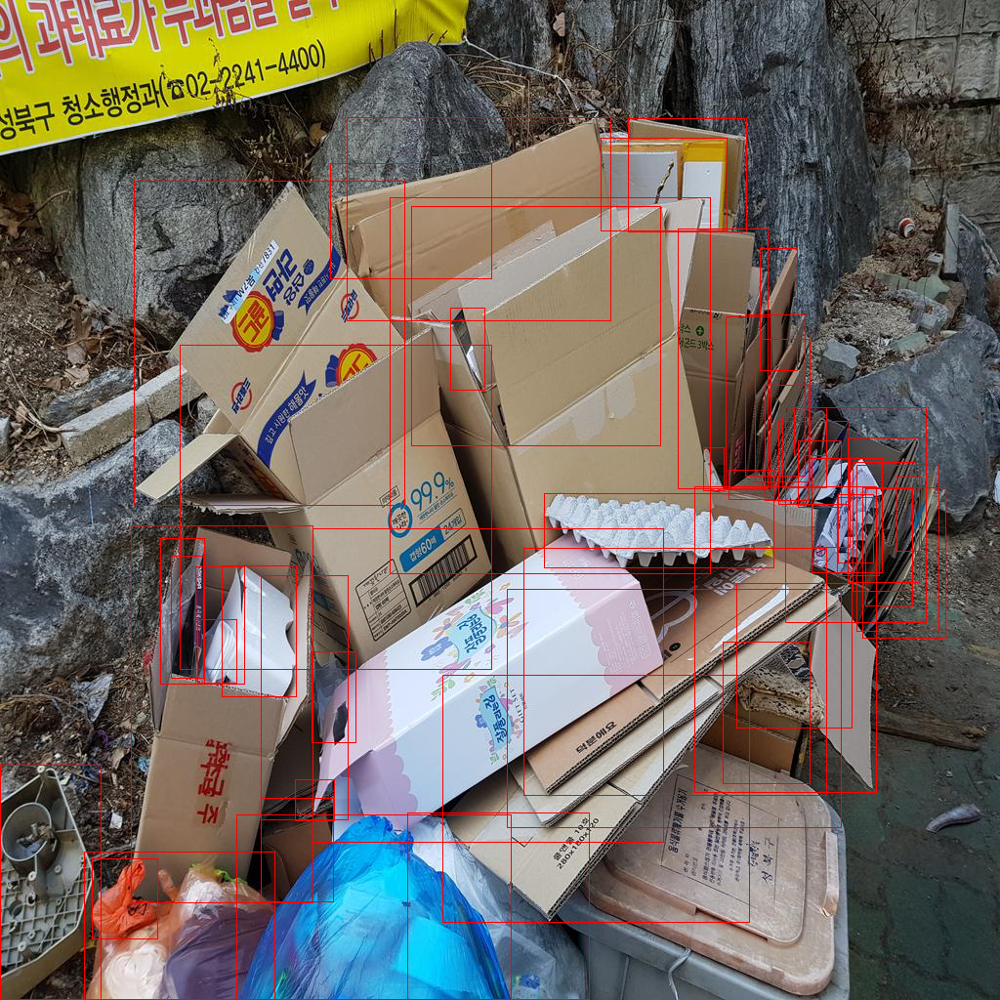

File Name = ../dataset/train/4047.jpg
(592.5, 229.2, 29.7, 49.4)
(408.9, 841.1, 188.2, 147.6)
(275.3, 381.6, 132.6, 244.8)
(322.0, 484.6, 124.2, 239.4)
(353.8, 371.8, 40.4, 50.8)
(0.0, 401.6, 71.9, 124.6)
(757.3, 311.2, 266.4, 345.4)
(674.0, 486.3, 194.0, 295.6)
(651.4, 451.4, 61.5, 116.5)
(344.1, 133.1, 137.7, 182.5)
(508.2, 158.8, 90.2, 116.1)
(482.0, 158.1, 84.8, 110.7)
(441.1, 234.0, 159.0, 135.1)
(480.8, 277.0, 102.9, 91.8)
(507.2, 317.0, 90.7, 58.6)
(584.1, 320.7, 57.1, 49.8)
(359.1, 374.2, 45.2, 22.7)
(358.9, 358.3, 93.7, 28.8)
(358.1, 352.2, 94.2, 33.2)
(357.8, 350.1, 93.0, 32.5)
(356.6, 348.1, 93.7, 30.8)
(356.1, 342.7, 93.7, 28.1)
(355.6, 334.6, 92.7, 28.4)
(355.0, 332.9, 91.9, 23.7)
(354.3, 325.1, 91.4, 20.3)
(353.5, 323.0, 91.2, 19.3)
(352.5, 320.3, 91.4, 19.6)
(352.0, 317.3, 91.4, 20.3)
(351.2, 308.1, 91.7, 26.1)
(350.0, 307.1, 90.9, 22.0)
(350.0, 300.4, 93.5, 26.1)
(349.0, 295.3, 94.2, 27.1)
(348.2, 292.9, 94.0, 25.7)
(346.9, 289.2, 95.5, 26.1)
(346.7, 285.8, 94.2, 24.4)


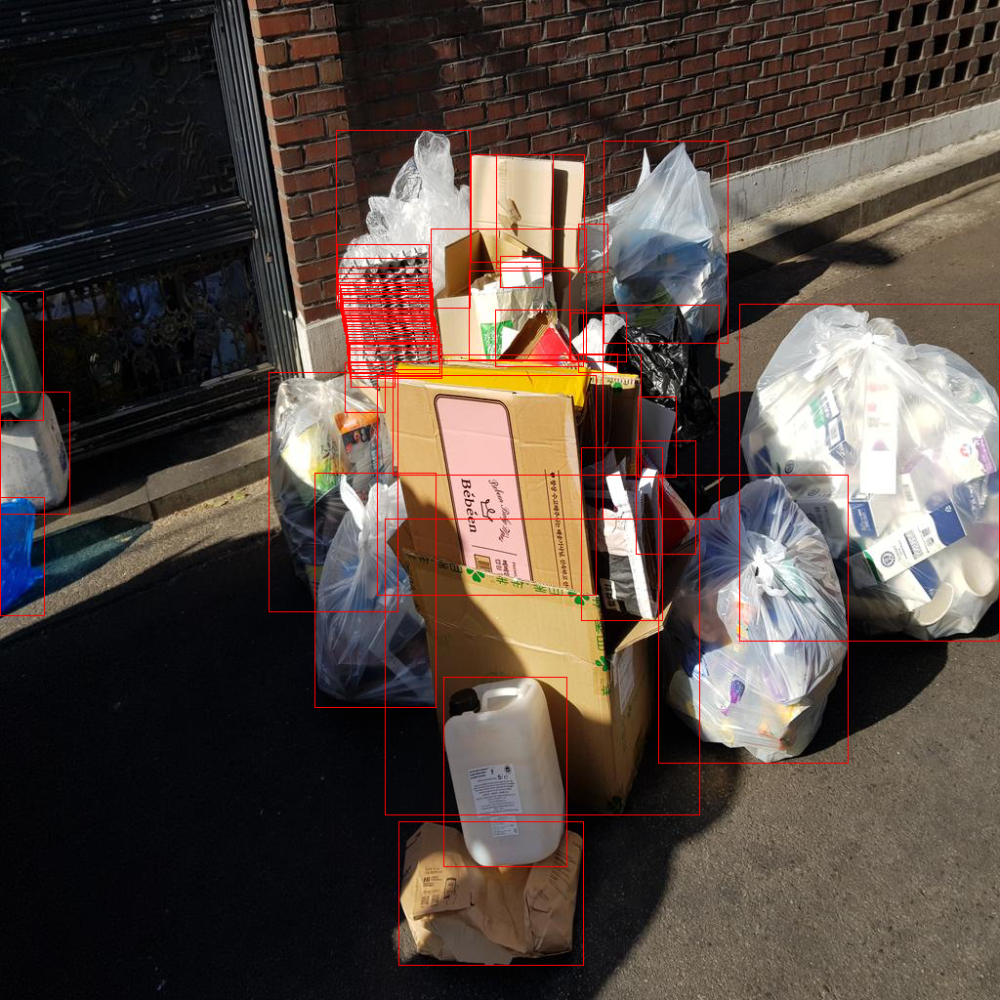

File Name = ../dataset/train/4197.jpg
(11.5, 567.6, 51.8, 42.7)
(0.0, 574.0, 25.1, 42.4)
(80.3, 583.6, 37.2, 11.9)
(11.2, 605.7, 72.5, 31.0)
(57.6, 597.8, 72.8, 27.9)
(74.8, 613.3, 73.5, 56.1)
(131.7, 677.1, 35.2, 38.3)
(728.7, 508.7, 211.6, 79.7)
(118.5, 824.4, 80.3, 44.4)
(207.6, 809.7, 141.2, 184.6)
(812.0, 595.8, 211.6, 128.5)
(857.1, 673.5, 47.7, 36.1)
(894.0, 654.5, 43.3, 19.8)
(901.1, 702.2, 56.6, 23.9)
(704.3, 919.9, 60.6, 103.9)
(870.9, 747.4, 56.2, 50.3)
(832.3, 622.0, 38.9, 18.3)
(319.3, 771.8, 72.8, 45.2)
(826.9, 715.9, 51.8, 24.9)
(792.0, 693.6, 54.9, 36.3)
(779.2, 717.2, 55.2, 30.0)
(794.8, 643.6, 39.6, 28.4)
(737.9, 543.2, 127.7, 107.9)
(777.1, 680.4, 75.2, 74.9)
(735.5, 578.8, 68.1, 42.2)
(753.8, 738.0, 70.4, 57.9)
(728.0, 730.2, 57.9, 23.4)
(718.9, 760.6, 47.7, 58.7)
(500.1, 803.3, 60.6, 47.7)
(730.4, 680.9, 57.6, 24.9)
(563.1, 732.7, 127.7, 46.0)
(597.0, 773.1, 51.8, 34.0)
(509.0, 710.1, 41.3, 42.7)
(531.6, 690.5, 108.7, 69.1)
(643.4, 750.7, 91.4, 50.5)
(431.1, 763.4,

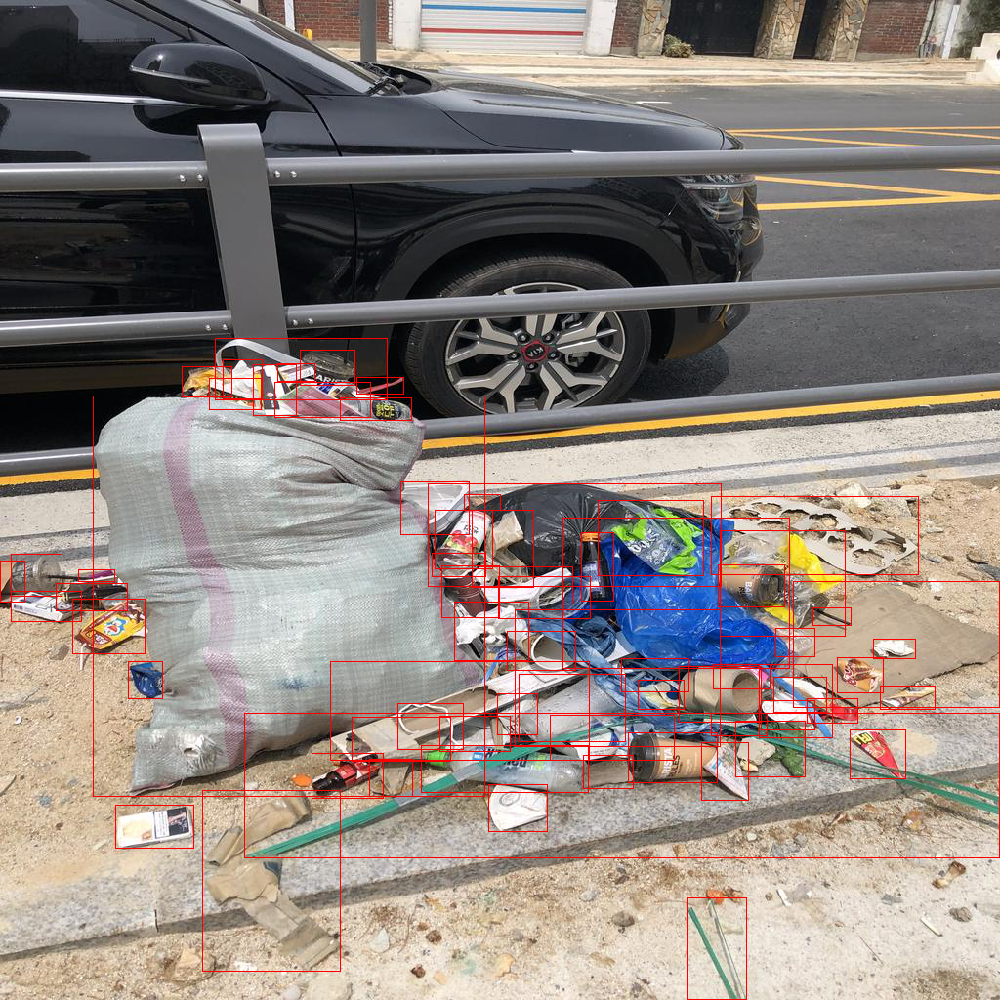

In [14]:
unique_key_set = set()
for annot_info in json_data['annotations']:
    unique_key_set.add(annot_info["image_id"])

image_per_box = {key: 0 for key in unique_key_set}
for annot_info in json_data['annotations']:
    image_per_box[annot_info["image_id"]] += 1


for image_id, box_cnt in image_per_box.items():                     # ! 1개의 Image 내의 Bbox가 매우 많은 경우가 학습에 도움이 되는가?
    if box_cnt >= 50:
        file_name = "../dataset/train/" + str(image_id).zfill(4) + ".jpg"
        print(f"File Name = {file_name}")
        img = Image.open(file_name).convert("RGB")
        
        draw = ImageDraw.Draw(img)
        for annot_data in json_data['annotations']:
            if annot_data["image_id"] == image_id:
                xmin, ymin = annot_data["bbox"][0], annot_data["bbox"][1]
                xmax, ymax = xmin + annot_data["bbox"][2], ymin + annot_data["bbox"][3]
                
                draw.rectangle((xmin, ymin, xmax, ymax), outline=(255, 0, 0), width=1)
                print(tuple(annot_data["bbox"]))
        
        img.show()

In [12]:
cate_box_size = defaultdict(list)
category_list = ["General trash", "Paper", "Paper pack", "Metal", "Glass", "Plastic", "Styrofoam", "Plastic bag", "Battery", "Clothing"]

for annot_info in json_data["annotations"]:                                 # ! 각 class별 Bbox의 평균 size 확인
    width, height = annot_info["bbox"][2], annot_info["bbox"][3]
    cate_box_size[annot_info["category_id"]].append((width, height))

cate_box_size = dict(sorted(cate_box_size.items()))

for cate in cate_box_size.keys():
    width_list = [width for width, height in cate_box_size[cate]]
    width_mean = round(sum(width_list) / len(width_list), 1)
    
    height_list = [height for width, height in cate_box_size[cate]]
    height_mean = round(sum(height_list) / len(height_list), 1)
    
    print(f"{category_list[cate]} Mean Size = {width_mean} X {height_mean}")

General trash Mean Size = 226.2 X 215.5
Paper Mean Size = 263.9 X 236.7
Paper pack Mean Size = 244.9 X 220.1
Metal Mean Size = 251.0 X 257.2
Glass Mean Size = 206.1 X 271.9
Plastic Mean Size = 239.4 X 230.7
Styrofoam Mean Size = 299.1 X 252.3
Plastic bag Mean Size = 275.4 X 301.2
Battery Mean Size = 228.9 X 215.0
Clothing Mean Size = 394.7 X 391.7
